In [2]:
pip install tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 1.2 MB/s eta 0:00:00m eta 0:00:010:00:05
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 2.9 MB/s eta 0:00:00m eta 0:00:010:00:01
  Using cached protobuf-4.22.3-cp37-abi3-manylinux2014_x86_64.whl (302 kB)
  Using cached termcolor-2.3.0-py3-none-any.whl (6.9 kB)
  Using cached keras-2.12.0-py2.py3-none-any.whl (1.7 MB)
  Using cached libclang-16.0.0-py2.py3-none-manylinux2010_x86_64.whl (22.9 MB)
  Using cached jax-0.4.8.tar.gz (1.2 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached gast-0.4.0-py3-none-any.whl (9.8 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl (57 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 3.0 MB/s eta 0:00:00m eta 0:00:010:01:01
  Using cached astunparse-1.6.3-py2.py3-none-any.whl (12 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 2.9 MB/s eta 0:00:00m eta 0

In [5]:
pip install keras

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install pandas


Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install opencv-python

  Using cached opencv_python-4.7.0.72-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (61.8 MB)
Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [14]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [17]:
import tensorflow as tf
import tensorflow.keras.layers as tfl
import os
import pandas as pd
from tqdm import tqdm
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras
from keras.models import Sequential
import keras
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt
from tensorflow.keras.utils import img_to_array
import numpy as np 
import pandas as pd 
import os
import re
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

In [18]:
base_directory = '/home/jtreddy/Downloads/archive/Image Super Resolution - Unsplash'
hires_folder = os.path.join(base_directory, 'high res')
lowres_folder = os.path.join(base_directory, 'low res')

In [19]:
data = pd.read_csv("/home/jtreddy/Downloads/archive/Image Super Resolution - Unsplash/image_data.csv")
data['low_res'] = data['low_res'].apply(lambda x: os.path.join(lowres_folder,x))
data['high_res'] = data['high_res'].apply(lambda x: os.path.join(hires_folder,x))
data.head()

,low_res,high_res
0,/home/jtreddy/Downloads/archive/Image Super Re...,/home/jtreddy/Downloads/archive/Image Super Re...
1,/home/jtreddy/Downloads/archive/Image Super Re...,/home/jtreddy/Downloads/archive/Image Super Re...
2,/home/jtreddy/Downloads/archive/Image Super Re...,/home/jtreddy/Downloads/archive/Image Super Re...
3,/home/jtreddy/Downloads/archive/Image Super Re...,/home/jtreddy/Downloads/archive/Image Super Re...
4,/home/jtreddy/Downloads/archive/Image Super Re...,/home/jtreddy/Downloads/archive/Image Super Re...


In [20]:
batch_size = 4

image_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)
mask_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.15)

train_hiresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='high_res',
        target_size=(512, 512),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

train_lowresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='low_res',
        target_size=(128, 128),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='training')

val_hiresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='high_res',
        target_size=(512, 512),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

val_lowresimage_generator = image_datagen.flow_from_dataframe(
        data,
        x_col='low_res',
        target_size=(128, 128),
        class_mode = None,
        batch_size = batch_size,
        seed=42,
        subset='validation')

train_generator = zip(train_lowresimage_generator, train_hiresimage_generator)
val_generator = zip(val_lowresimage_generator, val_hiresimage_generator)

def imageGenerator(train_generator):
    for (low_res, hi_res) in train_generator:
            yield (low_res, hi_res)

Found 3198 validated image filenames.
Found 3198 validated image filenames.
Found 564 validated image filenames.
Found 564 validated image filenames.


In [21]:
LSIZE = 128
HSIZE = 512
from keras import layers
def down(filters , kernel_low_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_low_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample
def up(filters, kernel_low_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_low_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(keras.layers.LeakyReLU())
    return upsample
def model():
    inputs = layers.Input(shape= [LSIZE,LSIZE,3])
    print(inputs.shape)
    d1 = down(128,(3,3),False)(inputs)
    print(d1.shape)
    d2 = down(128,(3,3),False)(d1)
    print(d2.shape)
    d3 = down(256,(3,3),True)(d2)
    print(d3.shape)
    d4 = down(512,(3,3),True)(d3)
    print(d4.shape)
    d5 = down(512,(3,3),True)(d4)
    print(d5.shape)
    #upsampling
    u1 = up(512,(3,3),False)(d5)
    print(u1.shape)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    print(u2.shape)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    print(u3.shape)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u6 = up(3,(3,3),False)(u5)
    u7 = up(3,(3,3),False)(u6)
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u7)
    return tf.keras.Model(inputs=inputs, outputs=output)
model = model()
model.summary()

(None, 128, 128, 3)
(None, 64, 64, 128)
(None, 32, 32, 128)
(None, 16, 16, 256)
(None, 8, 8, 512)
(None, 4, 4, 512)
(None, 8, 8, 512)
(None, 16, 16, 256)
(None, 32, 32, 128)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 64, 64, 128)  3584        ['input_1[0][0]']                
                                                                                                  
 sequential_1 (Sequential)      (None, 32, 32, 128)  147584      ['sequential[0][0]']             
                   

In [22]:
train_samples = train_hiresimage_generator.samples
val_samples = val_hiresimage_generator.samples

train_img_gen = imageGenerator(train_generator)
val_image_gen = imageGenerator(val_generator)

In [23]:
batch_size=1
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])
H = model.fit(train_img_gen,
                    steps_per_epoch=train_samples//batch_size,
                    validation_data=val_image_gen,
                    validation_steps=val_samples//batch_size,
                    epochs=20)


Epoch 1/20


2023-04-29 14:06:40.601685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


3198/3198 [==============================] - ETA: 0s - loss: 0.0689 - acc: 0.4867

2023-04-29 14:25:38.165179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


3198/3198 [==============================] - 1211s 378ms/step - loss: 0.0689 - acc: 0.4867 - val_loss: 0.0404 - val_acc: 0.7445
Epoch 2/20
3198/3198 [==============================] - 1160s 363ms/step - loss: 0.0425 - acc: 0.7425 - val_loss: 0.0387 - val_acc: 0.7311
Epoch 3/20
3198/3198 [==============================] - 1195s 374ms/step - loss: 0.0413 - acc: 0.7475 - val_loss: 0.0395 - val_acc: 0.7500
Epoch 4/20
3198/3198 [==============================] - 1195s 374ms/step - loss: 0.0407 - acc: 0.7502 - val_loss: 0.0376 - val_acc: 0.7551
Epoch 5/20
3198/3198 [==============================] - 1181s 369ms/step - loss: 0.0398 - acc: 0.7509 - val_loss: 0.0383 - val_acc: 0.7243
Epoch 6/20
3198/3198 [==============================] - 1214s 380ms/step - loss: 0.0391 - acc: 0.7517 - val_loss: 0.0382 - val_acc: 0.7527
Epoch 7/20
3198/3198 [==============================] - 1225s 383ms/step - loss: 0.0385 - acc: 0.7547 - val_loss: 0.0370 - val_acc: 0.7657
Epoch 8/20
3198/3198 [================

1/1 [==============================] - 0s 321ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


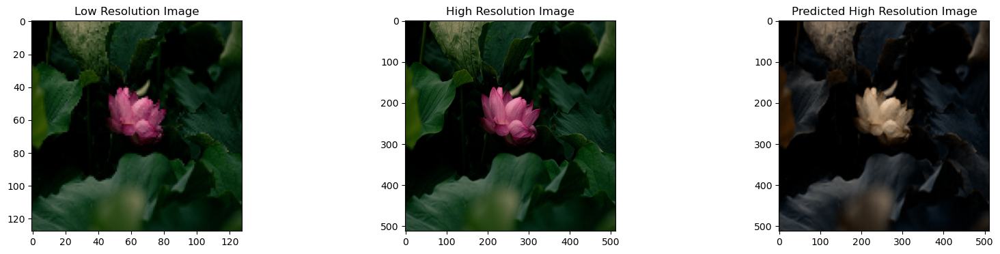

1/1 [==============================] - 0s 88ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


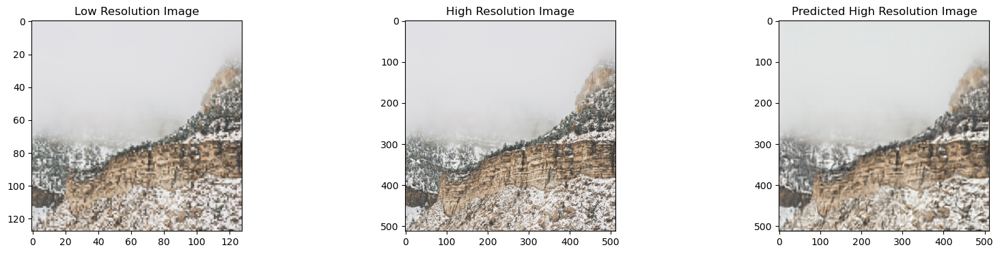

1/1 [==============================] - 0s 92ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


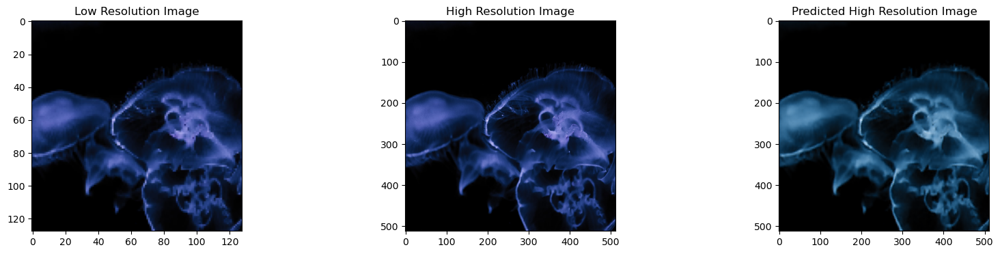

1/1 [==============================] - 0s 84ms/step


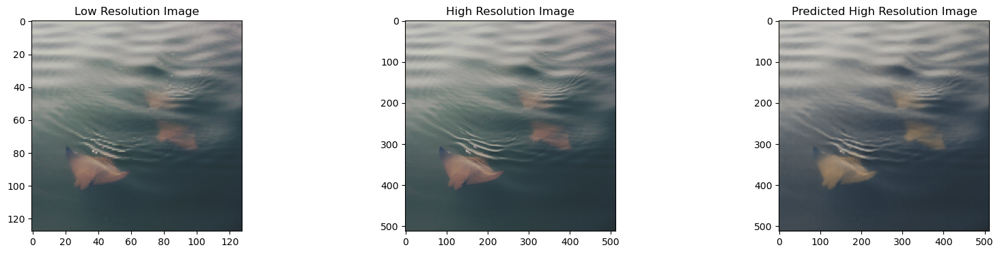

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


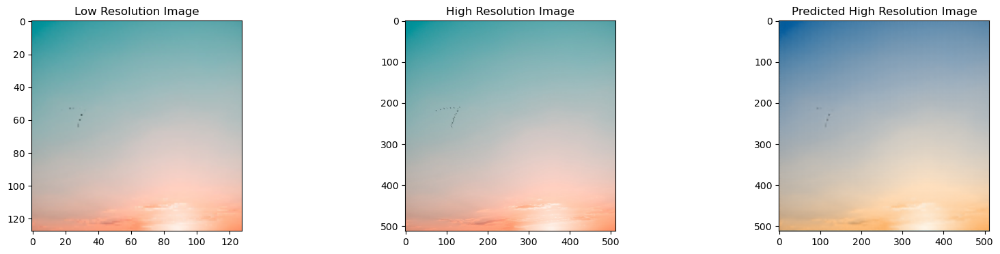

1/1 [==============================] - 0s 86ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


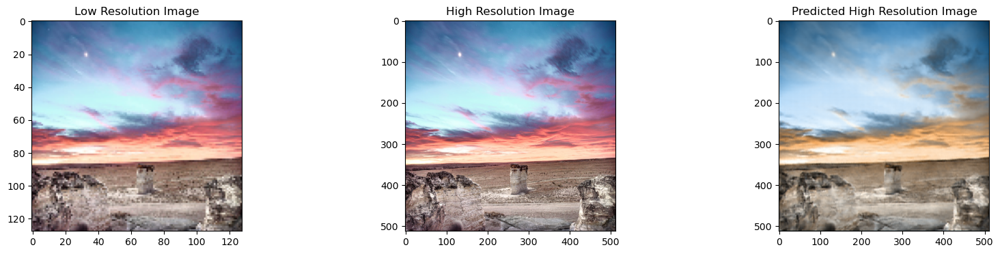

1/1 [==============================] - 0s 93ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


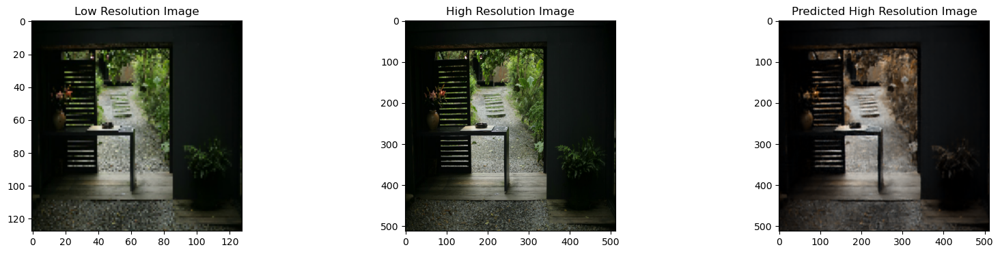

1/1 [==============================] - 0s 86ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


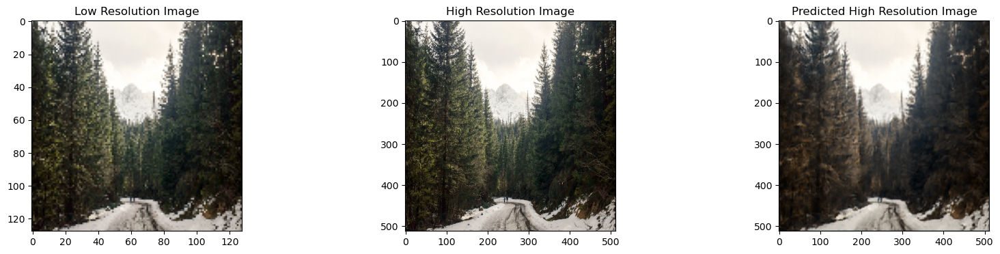

1/1 [==============================] - 0s 87ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


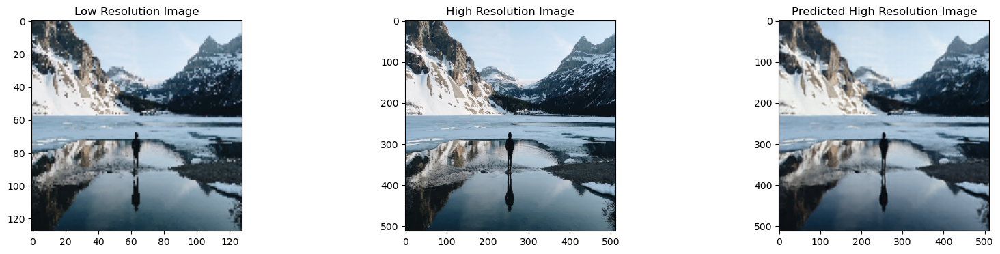

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


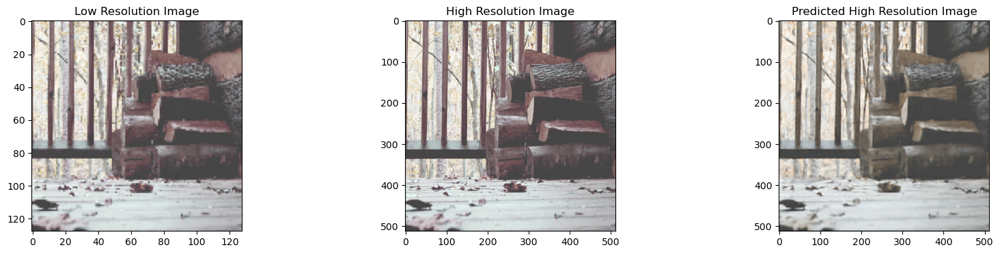

1/1 [==============================] - 0s 91ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


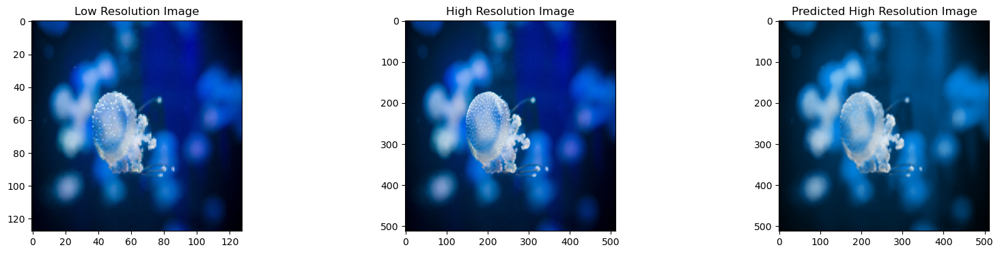

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


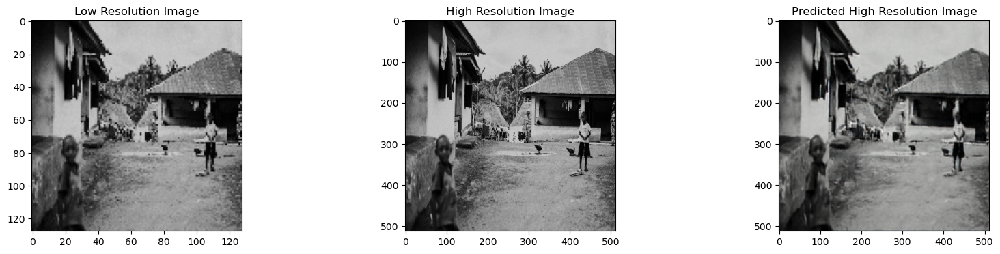

1/1 [==============================] - 0s 85ms/step


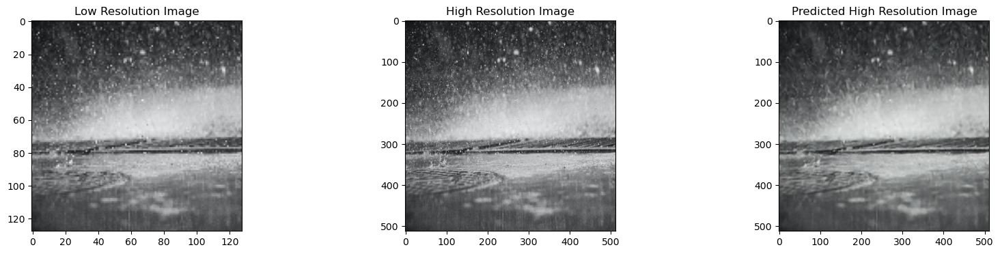

1/1 [==============================] - 0s 88ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


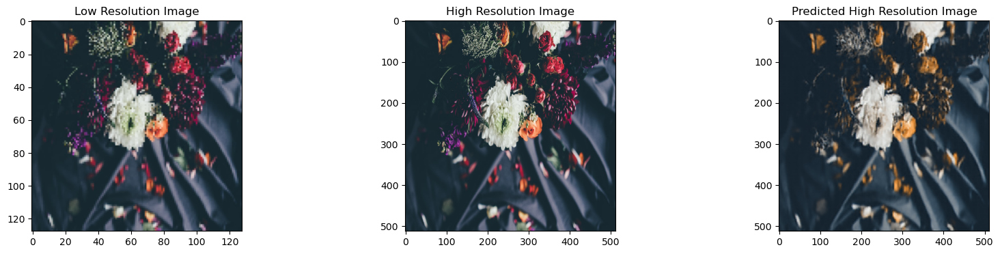

1/1 [==============================] - 0s 89ms/step


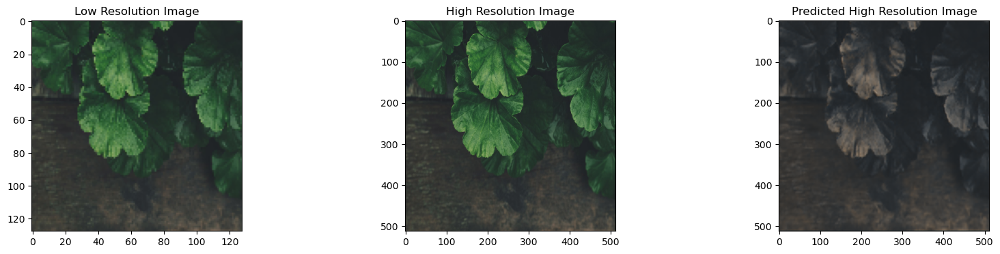

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


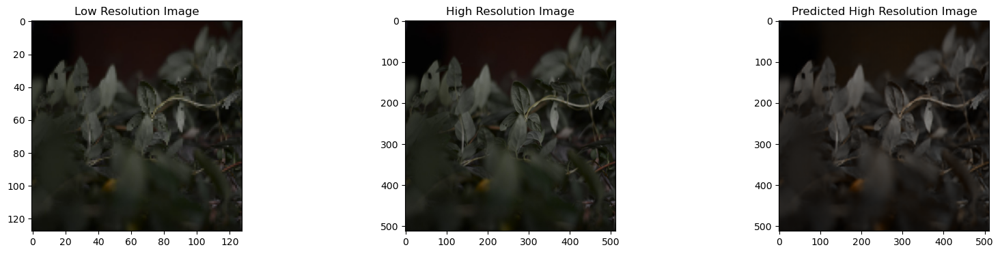

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


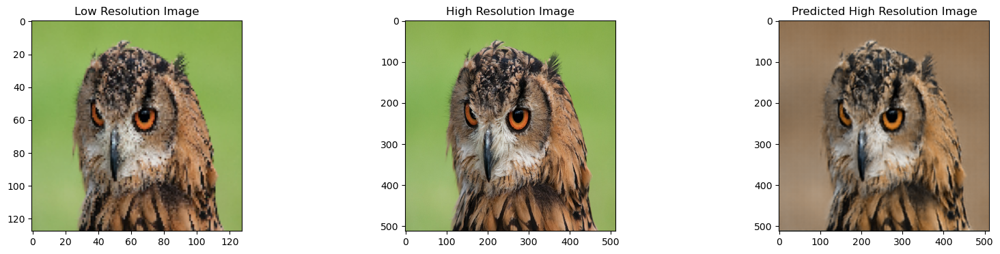

1/1 [==============================] - 0s 84ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


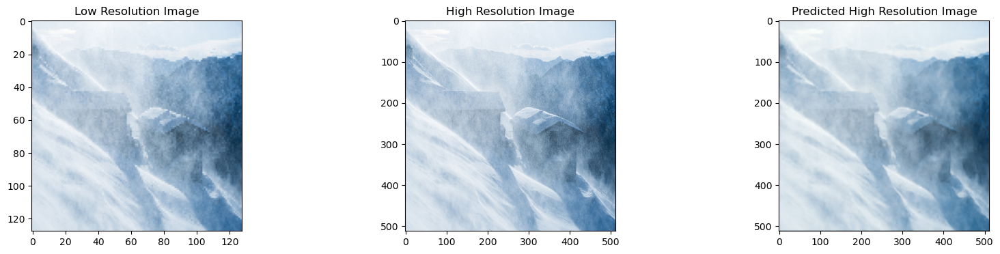

1/1 [==============================] - 0s 85ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


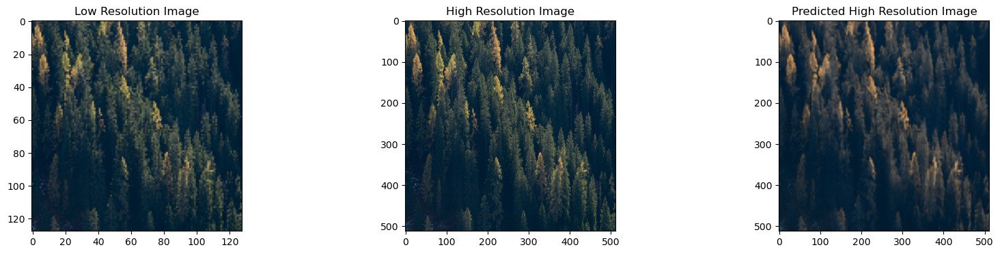

1/1 [==============================] - 0s 86ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


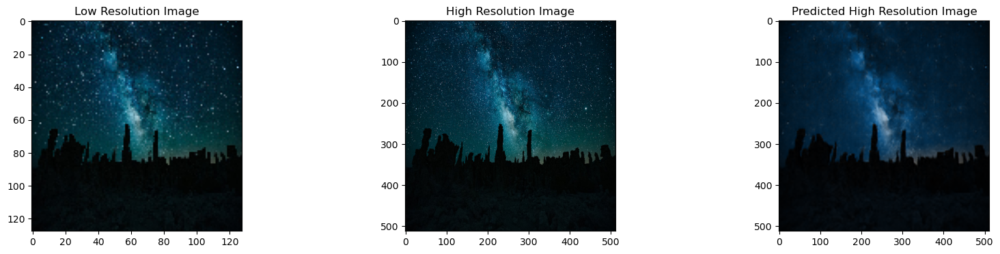

1/1 [==============================] - 0s 118ms/step


In [24]:
n = 0
for i,m in val_generator:
    img,mask = i,m
    sr1 = model.predict(img)
    if n < 20:
        fig, axs = plt.subplots(1 , 3, figsize=(20,4))
        axs[0].imshow(img[0])
        axs[0].set_title('Low Resolution Image')
        axs[1].imshow(mask[0])
        axs[1].set_title('High Resolution Image')
        axs[2].imshow(sr1[0])
        axs[2].set_title('Predicted High Resolution Image')
        plt.show()
        n+=1
    else:
        break

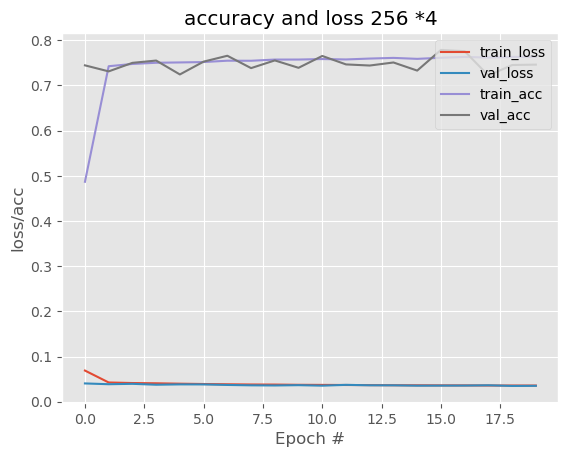

In [26]:
plt.style.use("ggplot")
plt.figure()
N=20
plt.plot(np.arange(0,N),H.history["loss"],label="train_loss")
plt.plot(np.arange(0,N),H.history["val_loss"],label="val_loss")
plt.plot(np.arange(0,N),H.history["acc"],label="train_acc")
plt.plot(np.arange(0,N),H.history["val_acc"],label="val_acc")
plt.title("accuracy and loss 256 *4")
plt.xlabel("Epoch #")
plt.ylabel("loss/acc")
plt.legend(loc="upper right")